## ✒️ Code Modules

In [1]:
from IPython.display import display,HTML,Image
import tensorflow as tf,tensorflow_hub as hub
import os,h5py,urllib,imageio
import pandas as pd,numpy as np,pylab as pl
file_path='https://raw.githubusercontent.com/'+\
           'OlgaBelitskaya/data_kitchen/main/'
file_name='HorseBreeds160.h5'
img_size=96

## ✒️ Image Data

In [2]:
def get_data(file_path,file_name,img_size=160):
    input_file=urllib.request.urlopen(file_path+file_name)
    output_file=open(file_name,'wb')
    output_file.write(input_file.read())
    output_file.close(); input_file.close()
    with h5py.File(file_name,'r') as f:
        keys=list(f.keys())
        print('file keys: '+', '.join(keys))
        images=np.array(f[keys[0]])
        images=tf.image.resize(images,[img_size,img_size]).numpy()
        labels=np.array(f[keys[1]])
        names=[el.decode('utf-8') for el in f[keys[2]]]
        f.close()
    return images,labels,names
images,labels,names=get_data(file_path,file_name,img_size)

file keys: images, labels, names


## ✒️ Data Processing

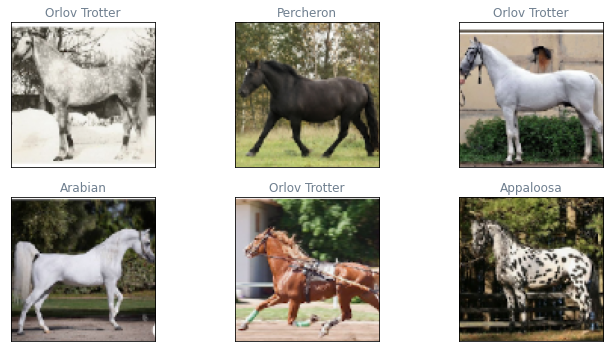

,train,valid,test
image shape,"(451, 96, 96, 3)","(56, 96, 96, 3)","(56, 96, 96, 3)"
image type,float32,float32,float32
label shape,"(451,)","(56,)","(56,)"
label type,int32,int32,int32


In [3]:
N=labels.shape[0]; n=int(.1*N)
num_classes=len(names); start=100 
shuffle_ids=np.arange(N)
np.random.RandomState(12).shuffle(shuffle_ids)
images=images[shuffle_ids]; labels=labels[shuffle_ids]
x_test,x_valid,x_train=images[:n],images[n:2*n],images[2*n:]
y_test,y_valid,y_train=labels[:n],labels[n:2*n],labels[2*n:]
df=pd.DataFrame(
    [[x_train.shape,x_valid.shape,x_test.shape],
     [x_train.dtype,x_valid.dtype,x_test.dtype],
     [y_train.shape,y_valid.shape,y_test.shape],
     [y_train.dtype,y_valid.dtype,y_test.dtype]],
    columns=['train','valid','test'],
    index=['image shape','image type','label shape','label type'])
def display_imgs(images,labels,names,start):
    fig=pl.figure(figsize=(10,5)); n=np.random.randint(0,start-1)
    for i in range(n,n+6):
        ax=fig.add_subplot(2,3,i-n+1,xticks=[],yticks=[])
        ax.set_title(
            names[labels[i]],color='slategray',fontdict={'fontsize':'large'})
        ax.imshow((images[i]))
    pl.tight_layout(); pl.show()
display_imgs(images,labels,names,start); display(df)

## ✒️ Super Resolution

In [4]:
def esrgantf2_superresolution(img,img_size=50):
    model=hub.load('https://tfhub.dev/captain-pool/esrgan-tf2/1')
    func=model.signatures[tf.saved_model.DEFAULT_SERVING_SIGNATURE_DEF_KEY]
    func.inputs[0].set_shape([1,img_size,img_size,3])
    converter=tf.lite.TFLiteConverter.from_concrete_functions([func])
    converter.optimizations=[tf.lite.Optimize.DEFAULT]
    tflite_model=converter.convert()
    with tf.io.gfile.GFile('ESRGAN.tflite','wb') as f:
        f.write(tflite_model)
    esrgan_model_path='./ESRGAN.tflite'
    if img.mean()<1.: img=img*255.
    lr=tf.image.resize(img,[img_size,img_size])
    lr=tf.expand_dims(lr.numpy()[:,:,:3],axis=0)
    lr=tf.cast(lr,tf.float32)
    interpreter=tf.lite.Interpreter(model_path=esrgan_model_path)
    interpreter.allocate_tensors()
    input_details=interpreter.get_input_details()
    output_details=interpreter.get_output_details()
    interpreter.set_tensor(input_details[0]['index'],lr)
    interpreter.invoke()
    output_data=interpreter.get_tensor(output_details[0]['index'])
    sr=tf.squeeze(output_data,axis=0)
    sr=tf.clip_by_value(sr,0,255)
    sr=tf.round(sr); sr=tf.cast(sr,tf.uint8)
    lr=tf.cast(tf.squeeze(lr,axis=0),tf.uint8)
    return lr,sr
lr,sr=esrgantf2_superresolution(images[0],img_size)

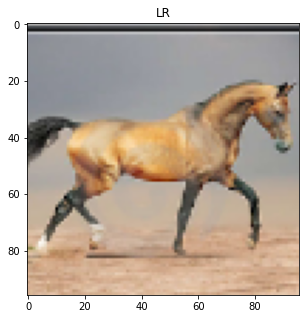

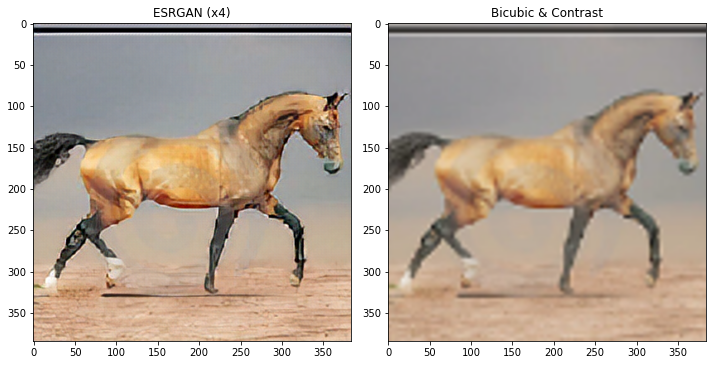

In [5]:
def low2super_bicubic_contrast(lr,sr):
    pl.figure(figsize=(10,5)); pl.title('LR')
    pl.imshow(lr.numpy()); pl.show()
    pl.figure(figsize=(10,5))
    pl.subplot(1,2,1); pl.title(f'ESRGAN (x4)')
    pl.imshow(sr.numpy())
    img_size=lr.shape[1]
    bicubic=tf.image.resize(
        lr,[img_size*4,img_size*4],
        tf.image.ResizeMethod.BICUBIC)
    bicubic_contrast=tf.image.adjust_contrast(bicubic,.8)
    bicubic_contrast=tf.cast(bicubic_contrast,tf.uint8)
    pl.subplot(1,2,2); pl.title('Bicubic & Contrast')
    pl.imshow(bicubic_contrast.numpy())
    pl.tight_layout(); pl.show()
low2super_bicubic_contrast(lr,sr)

## ✒️ Color Interpolation

In [6]:
def interpolate_hypersphere(v1,v2,steps):
    v1norm=tf.norm(v1); v2norm=tf.norm(v2)
    v2normalized=v2*(v1norm/v2norm)
    vectors=[]
    for step in range(steps):
        interpolated=v1+(v2normalized-v1)*step/(steps-1)
        interpolated_norm=tf.norm(interpolated)
        interpolated_normalized=interpolated*(v1norm/interpolated_norm)
        vectors.append(interpolated_normalized)
    return tf.stack(vectors).numpy() 

In [7]:
lr1,sr1=esrgantf2_superresolution(x_train[0],img_size)
lr2,sr2=esrgantf2_superresolution(x_train[1],img_size)
img1=sr1.numpy()/255.; img2=sr2.numpy()/255.
imgs=np.vstack([interpolate_hypersphere(img1,img2,30),
                interpolate_hypersphere(img2,img1,30)])

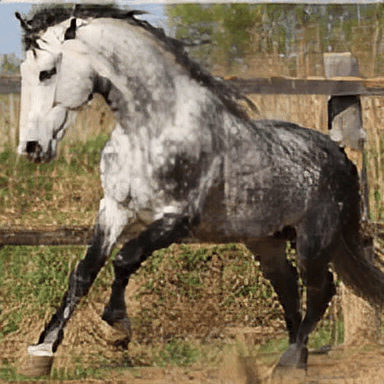

In [8]:
file_name='pic.gif'
imgs=np.array(imgs*255.,dtype=np.uint8)
imageio.mimsave(file_name,imgs)
Image(open('pic.gif','rb').read())

In [9]:
def array2string(a):
    astr=np.array2string(
        a.flatten(),separator=',',
        precision=8,threshold=np.inf)
    return astr.replace('\n ','')
#array2string(img1)

In [10]:
num_steps=30; fig_size=3
html_page="""
<!DOCTYPE HTML>
<html>
  <head>
    <meta charset='utf-8'>
    <meta name='viewport' content='width=device-width'>
    <script src='https://sagecell.sagemath.org/static/embedded_sagecell.js'></script>
    <script>$(function(){sagecell.makeSagecell(
        {inputLocation:'div.animate',autoeval:true,evalButtonText:'run',
         template:sagecell.templates.minimal});});
    </script>
  </head>
  <style>body {margin:5px 5px 5px 15px;}</style>
  <body>
<div class='animate'><script type='text/x-sage'>
file_path='https://olgabelitskaya.gitlab.io/images/'
file1='01_001.png'; file2='01_002.png'
import numpy as np,cv2,urllib
def interpolate_hypersphere(v1,v2,steps):
    v1norm=np.linalg.norm(v1)
    v2norm=np.linalg.norm(v2)
    v2normalized=v2*(v1norm/v2norm)
    vectors=[]
    for step in range(steps):
        interpolated=v1+(v2normalized-v1)*step/(steps-int(1))
        interpolated_norm=np.linalg.norm(interpolated)
        interpolated_normalized=\
        interpolated*(v1norm/interpolated_norm)
        vectors.append(interpolated_normalized)
    return np.array(vectors)
def get_img(file_name,file_path=file_path,img_size=int(64)):
    input_file=urllib.request.urlopen(file_path+file_name)
    output_file=open(file_name,'wb')
    output_file.write(input_file.read())
    output_file.close(); input_file.close()
    img=cv2.cvtColor(cv2.imread(file_name),cv2.COLOR_BGR2RGB)
    return cv2.resize(img,(img_size,img_size))/255
v1=get_img(file1); v2=get_img(file2)
imgs=np.vstack([interpolate_hypersphere(v1,v2,int(20)),
                interpolate_hypersphere(v2,v1,int(20))])
animate([matrix_plot(
    imgs[i],figsize=(3,3),frame=False) 
         for i in range(40)])
</script></div><br/>       
  </body>
</html>"""

In [11]:
print(html_page)


<!DOCTYPE HTML>
<html>
  <head>
    <meta charset='utf-8'>
    <meta name='viewport' content='width=device-width'>
    <script src='https://sagecell.sagemath.org/static/embedded_sagecell.js'></script>
    <script>$(function(){sagecell.makeSagecell(
        {inputLocation:'div.animate',autoeval:true,evalButtonText:'run',
         template:sagecell.templates.minimal});});
    </script>
  </head>
  <style>body {margin:5px 5px 5px 15px;}</style>
  <body>
<div class='animate'><script type='text/x-sage'>
file_path='https://olgabelitskaya.gitlab.io/images/'
file1='01_001.png'; file2='01_002.png'
import numpy as np,cv2,urllib
def interpolate_hypersphere(v1,v2,steps):
    v1norm=np.linalg.norm(v1)
    v2norm=np.linalg.norm(v2)
    v2normalized=v2*(v1norm/v2norm)
    vectors=[]
    for step in range(steps):
        interpolated=v1+(v2normalized-v1)*step/(steps-int(1))
        interpolated_norm=np.linalg.norm(interpolated)
        interpolated_normalized=        interpolated*(v1norm/interpolated

In [12]:
randi=str(np.random.randint(0,9999999))
file='animate_interpolation'+randi+'.html'
with open(file,'w') as f:
    f.write(html_page); f.close()
string="""<div id='html_string"""+randi+\
"""' style='width:100%;'><iframe src='"""+file+\
"""' height="""+str(fig_size*100)+"""
style='display:block; width:100%;'></iframe></div>"""
display(HTML(string))